### SDV Introduction

`Synthetic Data Vault (SDV)` is an ecosystem of libraries   that allows users to easily learn single-table, multi-table and time-series datasets to later on generate new synthetic data that has the same format and statistical properties as the original dataset.

For a multi-table table data scenario, the SDV provides the HMA1 Model (based on copula funtions). The  sdv.relational.HMA1 class implements what is called a Hierarchical Modeling Algorithm which is an algorithm that allows to recursively walk through a relational dataset and apply tabular models across all the tables in a way that lets the models learn how all the fields from all the tables are related. (https://sdv.dev/SDV/user_guides/relational/hma1.html)

`Furthermore, SDV models allow us to set a primary key of the table as well as some advanced usages including:`

 - Anonymizing Personally Identifiable Information (PII)
 - Setting Bounds and Specifying Rounding for Numerical Columns
 - Setting Distributions for Individual Variables
 - Conditional Sampling
 - Other Customizable Constraints and Evaluation Options 
 
According to the user guide, there are still other models for the single-table and time-series data scenarios. However, I will focus my article on the  multi-table data for now.

### Dataset Background


The dataset is a subset of the National Pasient Register dataset (NPR), anonymised and transformed for the purpose of synthetising .
The dataset is a relational model of the following entityes
 - referals (henvisningsperiode)
 - stays (episode)
 
 The dataset contains a good mix of features categorical,  numerical and primary key . Below i a short description of the columns:


 - referral
    - referalID: primary key
    - patientNr: foreign key to patient
    - referalDate: Creation Date of the referals
    - referal_length: length of referals (enddate of the referals - ansiendato)
    - MainDiagGrp: Grouped Main diagnosis of the last stay
    - ageGrp (ageGrpup: 1: 0-9,2:10-19,...)
    - sex (0: women, 1: men)
 - Stays 
    - stayID: primary key
    - referalID: foreign key  to referal
    - stayDate:  Date of the stay
    - stay_length: length of stay (enddate of the stay - innDatoTid)
    - polUtforendeGrp: grouped medical personnel
    - kontaktTypeGrp: grouped stayType
    - spesialist
    - rolleGrp: grouped rolle
    - MainDiagGrp: Grouped Main diagnosis 

### Code Implementation

In [1]:
import sdv
print(sdv.__version__)

1.10.0


In [2]:
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 300

In [3]:
#import sweetviz as sv
import pandas as pd
#import dtale
import numpy as np
import prince
%matplotlib inline


import os
import json

#from pandas.io.json import json_normalize
from datetime import datetime 
from tqdm import tqdm
from sklearn.preprocessing import PowerTransformer
#import umap.plot
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from scipy import stats

from sklearn.cluster import KMeans
from kmodes.kprototypes import KPrototypes

#from functions import condense_category,cluster_profile

from lightgbm import LGBMClassifier
import shap
from sklearn.model_selection import cross_val_score
import seaborn as sns
import warnings
with warnings.catch_warnings():
    warnings.simplefilter(action='ignore')    
    warnings.filterwarnings("ignore", category=DeprecationWarning) 
pd.set_option('display.max_columns', None)
from sdv.metadata import MultiTableMetadata
#from sdv import Metadata
from sdv.multi_table import HMASynthesizer
#from sdv.relational import HMA1
from sklearn.metrics import silhouette_samples , silhouette_score
import matplotlib.cm as cm
from kmodes.kmodes import KModes
from kmodes import kprototypes
from sklearn.metrics import silhouette_score
import plotly.express as px
import logging
logging.getLogger('matplotlib.font_manager').disabled = True
import seaborn as sns
from sklearn.metrics import silhouette_score, adjusted_mutual_info_score, adjusted_rand_score, calinski_harabasz_score, davies_bouldin_score
import gower
sns.set_theme(rc={'figure.figsize':(11.7,8.27)})
random_state=9999
scores = pd.DataFrame()






IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html


### Read the datasets

We start by  importing  the the patient, referal and stay entities. The data imported is beforehand  transformed and anonymised.

In [4]:
stay_features =['referralID', 'stayID'#,'stayOrder'
                ,'stayStartDate','stayEndDate',
       'stayLength',# 'ReshID_Avdeling', 'ReshID_Seksjon',
       'personnelGrp',  'stayTypeGrp','specialist',
       'roleGrp','cond1axis1Grp', 'cond1axis2Grp', 'cond1axis3Grp',
       'cond1axis4Grp', 'cond1axis5Grp','cond1axis6Grp'

]


df_stays = pd.read_csv("../../../data/processed/stays_transformed.csv",sep='\t'  
                    ,parse_dates=['stayStartDate','stayEndDate']
                       ,  dtype=
                 
                 { 'referralID':'int'
, 'stayID' : 'int'        

            


  
                     


                 },usecols =stay_features
  )

df_stays.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 73134 entries, 0 to 73133
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   referralID     73134 non-null  int64         
 1   stayID         73134 non-null  int64         
 2   stayStartDate  73134 non-null  datetime64[ns]
 3   stayEndDate    73134 non-null  datetime64[ns]
 4   stayLength     73134 non-null  int64         
 5   personnelGrp   73134 non-null  object        
 6   stayTypeGrp    73134 non-null  object        
 7   specialist     73134 non-null  object        
 8   roleGrp        73134 non-null  object        
 9   cond1axis1Grp  73134 non-null  object        
 10  cond1axis2Grp  73134 non-null  object        
 11  cond1axis3Grp  73134 non-null  object        
 12  cond1axis4Grp  73134 non-null  object        
 13  cond1axis5Grp  73134 non-null  object        
 14  cond1axis6Grp  73134 non-null  object        
dtypes: datetime64[ns](2

In [5]:
#df_stays.cond1axis6Grp.value_counts().plot(kind='barh')

In [6]:

referal_col =['referralID'  ,'patientNr','age','sex'
          ,'referralStartDate','referralLength','referralEndDate'
              ,'numOfStays'
               , 'cond1axis1GrpLast','cond1axis1GrpFirst'
            
#, 'henvFraInstitusjonID'MainDiagGroup
          ]


df_referrals = pd.read_csv("../../../data/processed/referrals_transformed.csv",sep='\t' ,parse_dates=['referralStartDate','referralEndDate']
  ,dtype=
                 
                 {
   
 'referralID': 'int',
 'patientNr'  : 'int' 
 #'age':'int' ,  
 # 'sex':'category' ,               
  
                 }
                                    ,usecols =referal_col
                                   )


df_referrals.age = df_referrals.age.astype(int)
df_referrals.sex = df_referrals.sex.astype(object)
df_referrals.info()     

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7730 entries, 0 to 7729
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   referralID          7730 non-null   int64         
 1   patientNr           7730 non-null   int64         
 2   age                 7730 non-null   int64         
 3   sex                 7730 non-null   object        
 4   referralStartDate   7730 non-null   datetime64[ns]
 5   referralEndDate     7730 non-null   datetime64[ns]
 6   referralLength      7730 non-null   int64         
 7   numOfStays          7730 non-null   int64         
 8   cond1axis1GrpLast   7730 non-null   object        
 9   cond1axis1GrpFirst  7730 non-null   object        
dtypes: datetime64[ns](2), int64(5), object(3)
memory usage: 604.0+ KB


In [7]:
df_referrals.head()

,referralID,patientNr,age,sex,referralStartDate,referralEndDate,referralLength,numOfStays,cond1axis1GrpLast,cond1axis1GrpFirst
0,294372,140891,15,1,2015-08-25,2017-04-05,589,13,F30-F39,F30-F39
1,151689,596853,14,2,2014-09-05,2016-12-06,823,27,F40-F48,F40-F48
2,845666,888598,14,1,2014-10-01,2016-04-21,568,28,andre,1999
3,736913,841235,13,2,2013-08-16,2015-02-22,555,5,F30-F39,F30-F39
4,998274,800875,15,2,2016-12-05,2018-07-12,584,11,F40-F48,F40-F48


In [8]:
len(df_referrals['referralID'].unique())

7730

In [9]:
len(df_stays['referralID'].unique())

7730

In [10]:
len(df_referrals['patientNr'].unique())

6924

In [11]:
df_referrals_t= df_referrals.copy()
df_stays_t =df_stays.copy()


In [12]:
df_stays_t =df_stays_t[ df_stays_t['referralID'].isin(df_referrals_t['referralID'].unique())]
df_stays_t.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 73134 entries, 0 to 73133
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   referralID     73134 non-null  int64         
 1   stayID         73134 non-null  int64         
 2   stayStartDate  73134 non-null  datetime64[ns]
 3   stayEndDate    73134 non-null  datetime64[ns]
 4   stayLength     73134 non-null  int64         
 5   personnelGrp   73134 non-null  object        
 6   stayTypeGrp    73134 non-null  object        
 7   specialist     73134 non-null  object        
 8   roleGrp        73134 non-null  object        
 9   cond1axis1Grp  73134 non-null  object        
 10  cond1axis2Grp  73134 non-null  object        
 11  cond1axis3Grp  73134 non-null  object        
 12  cond1axis4Grp  73134 non-null  object        
 13  cond1axis5Grp  73134 non-null  object        
 14  cond1axis6Grp  73134 non-null  object        
dtypes: datetime64[ns](2

In [13]:
len(df_stays_t['referralID'].unique())

7730

In [14]:
len(df_referrals_t['referralID'].unique())

7730

<Axes: xlabel='sexDesc'>

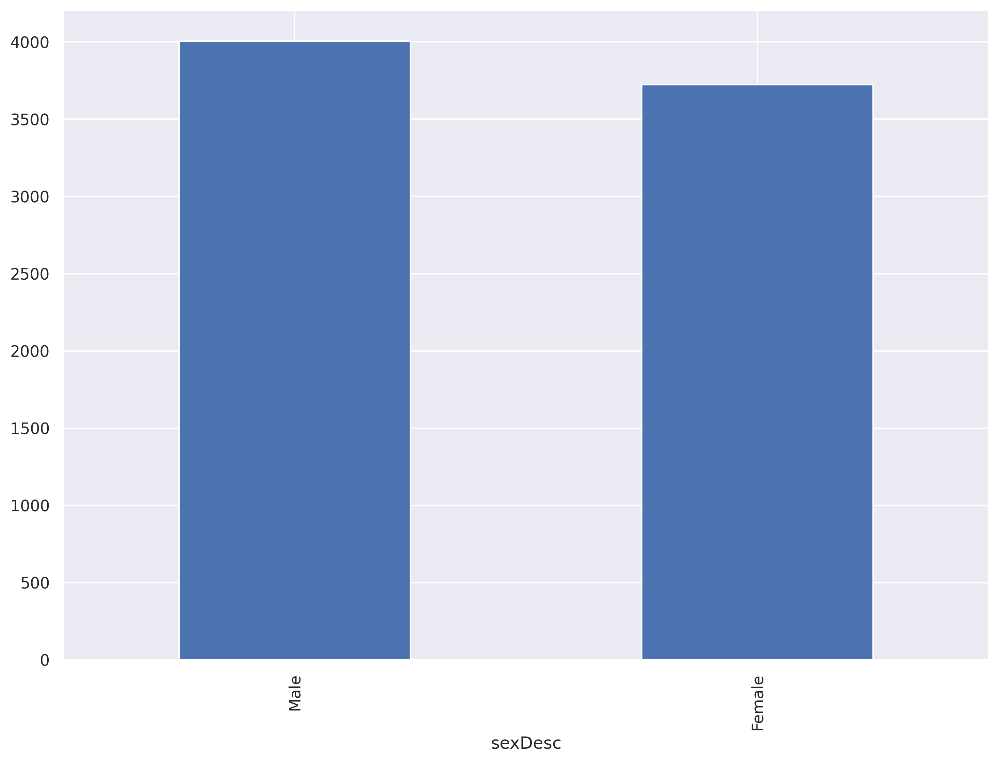

In [15]:
df_referrals_t['sexDesc'] = df_referrals_t['sex'].map({1:'Male', 2:'Female'})
df_referrals_t['sexDesc'].value_counts().plot(kind='bar')

<Axes: xlabel='ageGrp'>

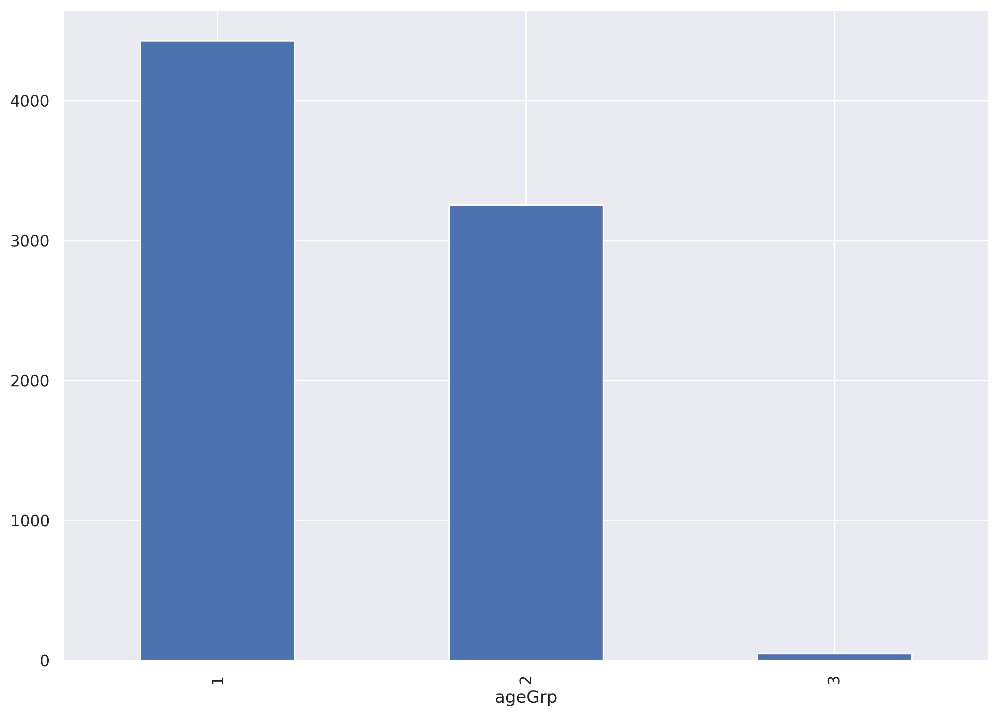

In [16]:
bins = [0,13,20,100 ]
labels = ['0-12','13-19', '20+']
df_referrals_t['ageGrpDesc'] = pd.cut(df_referrals_t.age, bins, labels = labels,include_lowest = True)
labels = ['1','2', '3']
df_referrals_t['ageGrp'] = pd.cut(df_referrals_t.age, bins, labels = labels,include_lowest = True)
df_referrals_t['ageGrp'].value_counts().plot(kind='bar')


### Select the features to synthetise

In [17]:
referral_features = [ 'referralID','referralStartDate','referralLength','age','sex'
                    
   #  , 'referralEndDate'
                   ]
df_referrals_r= df_referrals_t[referral_features]

df_referrals_r.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7730 entries, 0 to 7729
Data columns (total 5 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   referralID         7730 non-null   int64         
 1   referralStartDate  7730 non-null   datetime64[ns]
 2   referralLength     7730 non-null   int64         
 3   age                7730 non-null   int64         
 4   sex                7730 non-null   object        
dtypes: datetime64[ns](1), int64(3), object(1)
memory usage: 302.1+ KB


In [18]:
stay_features =['referralID', 'stayID' ,'stayStartDate'#'stayOrder'#, 'stayEndDate'
       ,'stayLength'#', 'ReshID_Avdeling', 'ReshID_Seksjon',
       ,'personnelGrp',  'stayTypeGrp','specialist',
       'roleGrp','cond1axis1Grp', 'cond1axis2Grp', 'cond1axis3Grp',
       'cond1axis4Grp', 'cond1axis5Grp','cond1axis6Grp'

              #  , 'cond5axis1Grp',      'cond6axis1Grp'
                   #, 'tilst2akse1Grp','tilst3akse1Grp' ,'tilst4akse1Grp' ,'tilst5akse1Grp' ,'tilst6akse1Grp' 

]

df_stays_r= df_stays_t[stay_features]
df_stays_r.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 73134 entries, 0 to 73133
Data columns (total 14 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   referralID     73134 non-null  int64         
 1   stayID         73134 non-null  int64         
 2   stayStartDate  73134 non-null  datetime64[ns]
 3   stayLength     73134 non-null  int64         
 4   personnelGrp   73134 non-null  object        
 5   stayTypeGrp    73134 non-null  object        
 6   specialist     73134 non-null  object        
 7   roleGrp        73134 non-null  object        
 8   cond1axis1Grp  73134 non-null  object        
 9   cond1axis2Grp  73134 non-null  object        
 10  cond1axis3Grp  73134 non-null  object        
 11  cond1axis4Grp  73134 non-null  object        
 12  cond1axis5Grp  73134 non-null  object        
 13  cond1axis6Grp  73134 non-null  object        
dtypes: datetime64[ns](1), int64(3), object(10)
memory usage: 7.8+ MB


<Axes: ylabel='Density'>

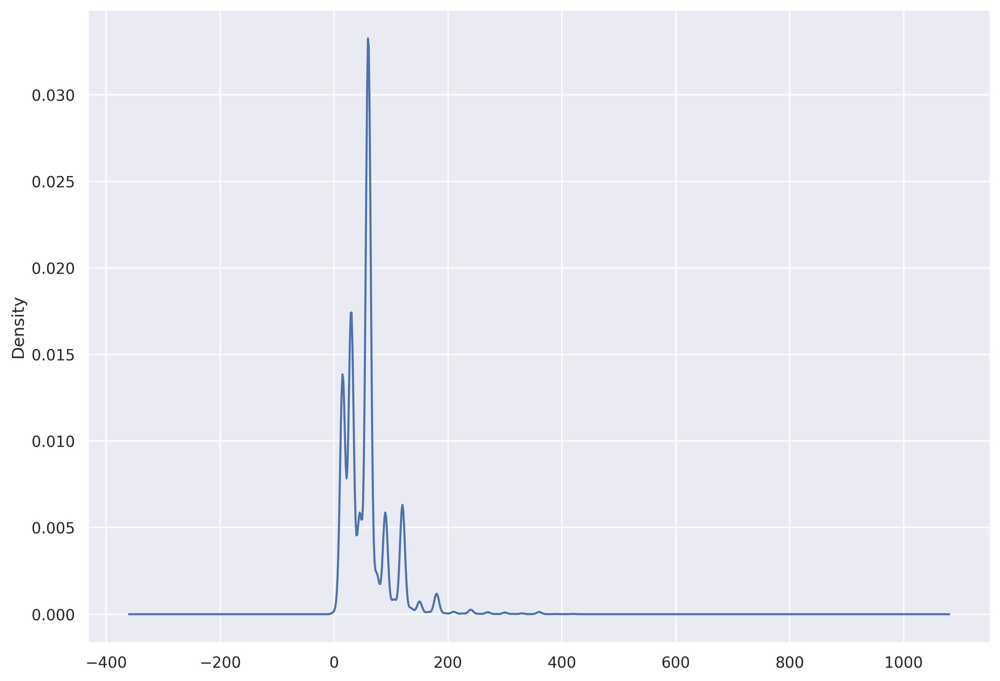

In [19]:
df_stays_r.stayLength.plot(kind='density')

<Axes: ylabel='Frequency'>

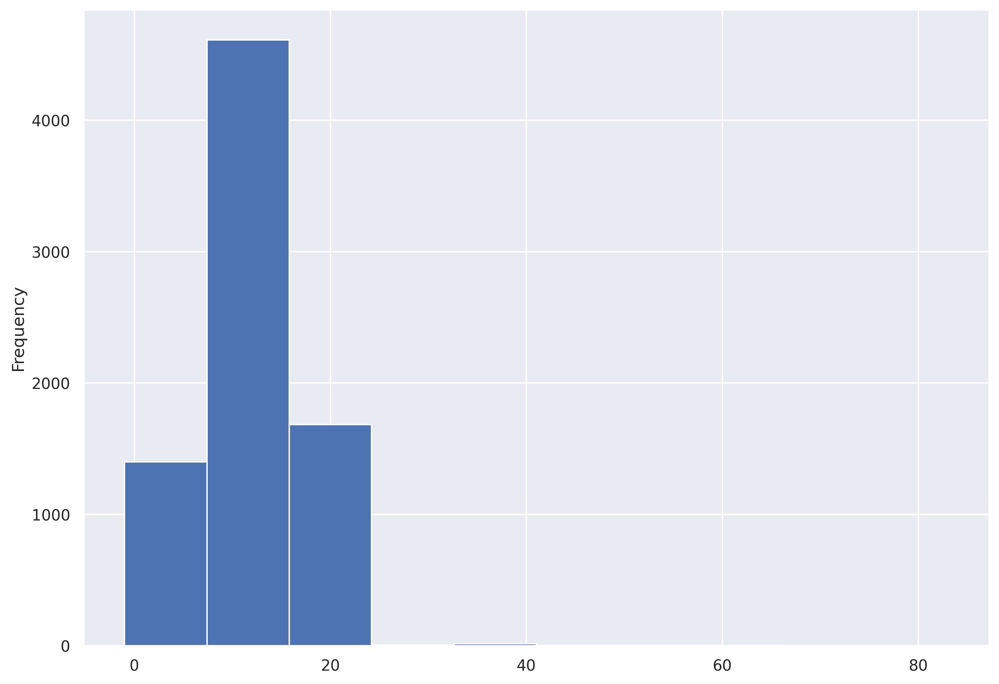

In [20]:
df_referrals_r['age'].plot(kind='hist')

In [21]:

#real_data ={'stay':df_stays_real,'referral':df_referrals_real,'patient':df_patients_real}
real_data ={'stay':df_stays_r,'referral':df_referrals_r}

In [22]:

ids = df_referrals_r["referralID"]
df_referrals_r[ids.isin(ids[ids.duplicated()])].sort_values("referralID")

,referralID,referralStartDate,referralLength,age,sex


### Build the metadata object for the dataset


In [112]:
#https://sdv.dev/SDV/user_guides/relational/hma1.html

In SDV, the structure of a dataset is represented using the class sdv.Metadata, which contains all the information that SDV needs in order to optimally learn the dataset and generate synthetic versions of it. We created a json file metadata_simple.json with all the information that SDV needs to know about the dataset and progmatically added som extra variables to one of the classes (stays). 

In [113]:
from sdv.metadata import MultiTableMetadata
metadata = MultiTableMetadata()
metadata.detect_from_dataframes(
    data=real_data
)


In [114]:
metadata.validate()

In [115]:
metadata.validate_data(data=real_data)

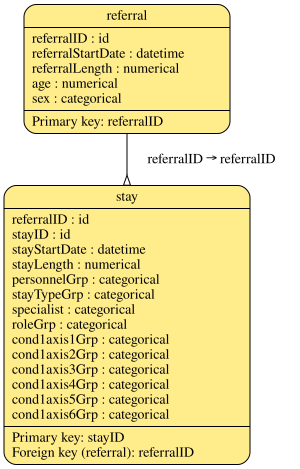

In [116]:
metadata.visualize(
    show_table_details='full',
    show_relationship_labels=True#,
    #output_filepath='my_metadata.png'
)

For more details about how to build the Metadata ,  refer to the Relational Metadata Guide.https://sdv.dev/SDV/user_guides/relational/relational_metadata.html#relational-metadata

### Build the HMA1 Synthetic model


`We use now the HMA1 class to learn the real data.` The output model will be used to  sample synthetic data about new referals/patients/stays, we proceed by:

 - Import the sdv.relational.HMA1 class and create an instance of it passing the metadata that we just loaded.

 - Call its fit method passing the tables dict.

In [29]:
#my_model_kwargs ={'default_distribution': 'gaussian','categorical_transformer':'LabelEncoder'}
#model = HMA1(metadata=metadata,model_kwargs=my_model_kwargs)
synthesizer = HMASynthesizer(metadata)

#synthesizer.auto_assign_transformers(real_data)

We strongly recommend saving the metadata using 'save_to_json' for replicability in future SDV versions.


In [62]:
synthesizer.fit(real_data)


Preprocess Tables:  50%|█████     | 1/2 [00:04<00:04,  4.98s/it]Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
Preprocess Tables: 100%|██████████| 2/2 [00:06<00:00,  3.05s/it]



Learning relationships:


(1/1) Tables 'referral' and 'stay' ('referralID'): 100%|██████████| 7730/7730 [55:13<00:00,  2.33it/s]  


Modeling Tables: 100%|██████████| 1/1 [00:33<00:00, 33.32s/it]


In [63]:

synthesizer.set_table_parameters(
    table_name='stay',
    #table_synthesizer='GaussianCopulaSynthesizer',
    table_parameters={
        'enforce_min_max_values': True,
         'default_distribution': 'truncnorm',
          'numerical_distributions': { 
            'stayLength': 'norm',
           'stayStartDate': 'uniform' 
         
            
        }
   
         
     
    }
)

synthesizer.set_table_parameters(
    table_name='referral',
    #table_synthesizer='GaussianCopulaSynthesizer',
    table_parameters={
        'enforce_min_max_values': True,
        'default_distribution': 'truncnorm',
        'numerical_distributions': { 
            'referralLength': 'gamma',
            'age': 'norm',
            'sex': 'norm',
        'referralStartDate': 'uniform' 
         
            
        }
    }
)

synthesizer.fit(real_data)


Preprocess Tables:  50%|█████     | 1/2 [00:04<00:04,  4.81s/it]Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
Preprocess Tables: 100%|██████████| 2/2 [00:05<00:00,  2.96s/it]



Learning relationships:


(1/1) Tables 'referral' and 'stay' ('referralID'):   0%|          | 4/7730 [00:00<03:19, 38.71it/s]divide by zero encountered in scalar divide
invalid value encountered in scalar divide
(1/1) Tables 'referral' and 'stay' ('referralID'):   0%|          | 34/7730 [00:00<03:34, 35.87it/s]invalid value encountered in scalar divide
divide by zero encountered in scalar divide
divide by zero encountered in scalar divide
divide by zero encountered in scalar divide
(1/1) Tables 'referral' and 'stay' ('referralID'):   1%|          | 41/7730 [00:01<02:59, 42.94it/s]invalid value encountered in scalar divide
divide by zero encountered in scalar divide
(1/1) Tables 'referral' and 'stay' ('referralID'):   1%|          | 46/7730 [00:01<03:26, 37.22it/s]invalid value encountered in scalar divide
divide by zero encountered in scalar divide
(1/1) Tables 'referral' and 'stay' ('referralID'):   1%|          | 50/7730 [00:01<03:39, 34.91it/s]divide by zero encountered in scalar divide
invalid value encount

Modeling Tables:   0%|          | 0/1 [00:00<?, ?it/s]divide by zero encountered in scalar divide
divide by zero encountered in scalar divide
Modeling Tables: 100%|██████████| 1/1 [00:01<00:00,  1.77s/it]


In [64]:
synthesizer.save('../../model/synthetiser.pkl')
#synthesizer.save('../../models/latest.pkl')

In [29]:

synthesizer = HMASynthesizer.load('../../model/synthetiser.pkl')


In [30]:

synthesizer.get_transformers(table_name='referral')

{'referralID': IDGenerator(),
 'referralStartDate': UnixTimestampEncoder(datetime_format='%Y-%m-%d', enforce_min_max_values=True),
 'referralLength': FloatFormatter(learn_rounding_scheme=True, enforce_min_max_values=True),
 'age': FloatFormatter(learn_rounding_scheme=True, enforce_min_max_values=True),
 'sex': UniformEncoder()}

In [31]:

synthesizer.get_transformers(table_name='stay')

{'referralID': None,
 'stayID': IDGenerator(),
 'stayStartDate': UnixTimestampEncoder(datetime_format='%Y-%m-%d %H:%M:%S', enforce_min_max_values=True),
 'stayLength': FloatFormatter(learn_rounding_scheme=True, enforce_min_max_values=True),
 'personnelGrp': UniformEncoder(),
 'stayTypeGrp': UniformEncoder(),
 'specialist': UniformEncoder(),
 'roleGrp': UniformEncoder(),
 'cond1axis1Grp': UniformEncoder(),
 'cond1axis2Grp': UniformEncoder(),
 'cond1axis3Grp': UniformEncoder(),
 'cond1axis4Grp': UniformEncoder(),
 'cond1axis5Grp': UniformEncoder(),
 'cond1axis6Grp': UniformEncoder()}

we generate new data by calling the sample function

In [32]:
#synthesizer.reset_sampling()
synthetic_data = synthesizer.sample(scale=1) 


There are null values in the transformed data. The reversed transformed data will contain null values.
There are null values in the transformed data. The reversed transformed data will contain null values.
There are null values in the transformed data. The reversed transformed data will contain null values.
There are null values in the transformed data. The reversed transformed data will contain null values.
There are null values in the transformed data. The reversed transformed data will contain null values.
There are null values in the transformed data. The reversed transformed data will contain null values.
There are null values in the transformed data. The reversed transformed data will contain null values.
There are null values in the transformed data. The reversed transformed data will contain null values.
There are null values in the transformed data. The reversed transformed data will contain null values.
There are null values in the transformed data. The reversed transformed d


we store the synthetic data into the dataframes for evaluation

In [42]:
df_referrals_synthetic= synthetic_data['referral']
df_stays_synthetic= synthetic_data['stay']
#df_patients_synthetic= synthetic_data['patient']

In [43]:
df_referrals_synthetic.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7730 entries, 0 to 7729
Data columns (total 5 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   referralID         7730 non-null   int64         
 1   referralStartDate  7730 non-null   datetime64[ns]
 2   referralLength     7730 non-null   int64         
 3   age                7730 non-null   int64         
 4   sex                7730 non-null   object        
dtypes: datetime64[ns](1), int64(3), object(1)
memory usage: 302.1+ KB


In [44]:
df_stays_synthetic.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 88225 entries, 0 to 88224
Data columns (total 14 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   referralID     88225 non-null  int64         
 1   stayID         88225 non-null  int64         
 2   stayStartDate  88225 non-null  datetime64[ns]
 3   stayLength     88225 non-null  int64         
 4   personnelGrp   88140 non-null  object        
 5   stayTypeGrp    88133 non-null  object        
 6   specialist     87648 non-null  object        
 7   roleGrp        88223 non-null  object        
 8   cond1axis1Grp  88084 non-null  object        
 9   cond1axis2Grp  88215 non-null  object        
 10  cond1axis3Grp  88225 non-null  object        
 11  cond1axis4Grp  88183 non-null  object        
 12  cond1axis5Grp  88194 non-null  object        
 13  cond1axis6Grp  87746 non-null  object        
dtypes: datetime64[ns](1), int64(3), object(10)
memory usage: 9.4+ MB


In [ ]:



df_referrals_synthetic.to_csv("../../data/synthetic/referrals_synthetic.csv", sep='\t',index=False)


In [23]:



df_referrals_synthetic = pd.read_csv("../../../data/synthetic/referrals_synthetic.csv",sep='\t'
                           ,parse_dates=['referralStartDate']
  ,dtype=
                 
                 {
   
 'referralID': 'int',
 'patientNr'  : 'int'                 
  
                 }
                                    
                                   )


df_referrals_synthetic.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 46380 entries, 0 to 46379
Data columns (total 5 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   referralID         46380 non-null  int64         
 1   referralStartDate  46380 non-null  datetime64[ns]
 2   referralLength     46380 non-null  int64         
 3   age                46380 non-null  int64         
 4   sex                46380 non-null  int64         
dtypes: datetime64[ns](1), int64(4)
memory usage: 1.8 MB


In [15]:


df_stays_synthetic.to_csv("../../../data/synthetic/stays_synthetic.csv", sep='\t',index=False)


In [24]:

df_stays_synthetic = pd.read_csv("../../../data/synthetic/stays_synthetic.csv",sep='\t'  
                    ,parse_dates=['stayStartDate']
                       ,  dtype=
                 
                 { 'referralID':'int'
, 'stayID' : 'int'        

            


  
                     


                 }
  )
df_stays_synthetic.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 530007 entries, 0 to 530006
Data columns (total 14 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   referralID     530007 non-null  int64         
 1   stayID         530007 non-null  int64         
 2   stayStartDate  530007 non-null  datetime64[ns]
 3   stayLength     530007 non-null  int64         
 4   personnelGrp   529816 non-null  object        
 5   stayTypeGrp    529487 non-null  object        
 6   specialist     526825 non-null  object        
 7   roleGrp        530001 non-null  object        
 8   cond1axis1Grp  529123 non-null  object        
 9   cond1axis2Grp  529705 non-null  object        
 10  cond1axis3Grp  530004 non-null  object        
 11  cond1axis4Grp  529753 non-null  object        
 12  cond1axis5Grp  529704 non-null  object        
 13  cond1axis6Grp  527306 non-null  object        
dtypes: datetime64[ns](1), int64(3), object(10)
memory us

In [17]:
#synthetic_data_t ={'stay':df_stays_synth,'referral':df_referrals_synth,'patient':df_patients_synth}
synthetic_data ={'stay':df_stays_synthetic,'referral':df_referrals_synthetic}

### Check number of orphans patient--> referal-->stay

In [32]:
referallist=df_stays_synthetic.referralID.unique().tolist()
referalliststay=df_referrals_synthetic.referralID.unique().tolist()
diff =list(set(referallist) - set(referalliststay))
len(diff)

0

### Evaluate the HMA1 synthetic Model

### Quality/Diagnostics Report

In [33]:
from sdv.evaluation.multi_table import evaluate_quality
quality_report = evaluate_quality(
    real_data=real_data,
    synthetic_data=synthetic_data,
    metadata=metadata)

Generating report ...
(2/4) Evaluating Column Pair Trends: :  26%|██▌       | 26/101 [00:00<00:00, 226.56it/s]

(4/4) Evaluating Intertable Trends: : 100%|██████████| 70/70 [00:09<00:00,  7.40it/s]

Overall Score: 76.57%

Properties:
- Column Shapes: 88.24%
- Column Pair Trends: 73.41%
- Cardinality: 81.0%
- Intertable Trends: 63.63%


In [34]:
from sdv.evaluation.multi_table import run_diagnostic

diagnostic_report = run_diagnostic(
    real_data=real_data,
    synthetic_data=synthetic_data,
    metadata=metadata
)

Generating report ...
(1/3) Evaluating Data Validity: : 100%|██████████| 19/19 [00:00<00:00, 46.44it/s]

Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`



(3/3) Evaluating Relationship Validity: : 100%|██████████| 1/1 [00:00<00:00, 55.77it/s]

Overall Score: 99.97%

Properties:
- Data Validity: 99.91%
- Data Structure: 100.0%
- Relationship Validity: 100.0%


### Detail- report

In [35]:

quality_report.get_details(property_name='Column Shapes', table_name='referral')

,Table,Column,Metric,Score
12,referral,referralStartDate,KSComplement,0.395321
13,referral,referralLength,KSComplement,0.970354
14,referral,age,KSComplement,0.922122
15,referral,sex,TVComplement,0.992777


In [36]:
quality_report.get_details(property_name='Column Shapes', table_name='stay')

,Table,Column,Metric,Score
0,stay,stayStartDate,KSComplement,0.906105
1,stay,stayLength,KSComplement,0.764891
2,stay,personnelGrp,TVComplement,0.874018
3,stay,stayTypeGrp,TVComplement,0.787713
4,stay,specialist,TVComplement,0.952784
5,stay,roleGrp,TVComplement,0.979492
6,stay,cond1axis1Grp,TVComplement,0.979755
7,stay,cond1axis2Grp,TVComplement,0.967339
8,stay,cond1axis3Grp,TVComplement,0.897176
9,stay,cond1axis4Grp,TVComplement,0.941188


## Anonimity

In [25]:
import matplotlib.pyplot as plt
#import seaborn as sns

from anonymeter.evaluators import SinglingOutEvaluator
from anonymeter.evaluators import LinkabilityEvaluator
from anonymeter.evaluators import InferenceEvaluator

In [26]:
columns =[ 'stayLength', 'stayStartDate', 'personnelGrp',
       'stayTypeGrp', 'specialist', 'roleGrp', 'cond1axis1Grp',
       'cond1axis2Grp', 'cond1axis3Grp', 'cond1axis4Grp', 'cond1axis5Grp',
       'cond1axis6Grp', 'age', 'sex', 'referralLength', 'referralStartDate']
ori=pd.merge(df_stays_r,df_referrals_r,on=['referralID'])
ori = ori[columns]
ori= ori#.sample(50000,replace=False)
ori.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 73134 entries, 0 to 73133
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   stayLength         73134 non-null  int64         
 1   stayStartDate      73134 non-null  datetime64[ns]
 2   personnelGrp       73134 non-null  object        
 3   stayTypeGrp        73134 non-null  object        
 4   specialist         73134 non-null  object        
 5   roleGrp            73134 non-null  object        
 6   cond1axis1Grp      73134 non-null  object        
 7   cond1axis2Grp      73134 non-null  object        
 8   cond1axis3Grp      73134 non-null  object        
 9   cond1axis4Grp      73134 non-null  object        
 10  cond1axis5Grp      73134 non-null  object        
 11  cond1axis6Grp      73134 non-null  object        
 12  age                73134 non-null  int64         
 13  sex                73134 non-null  object        
 14  referr

In [27]:
from sklearn.model_selection import train_test_split
ori, control = train_test_split(ori, test_size=0.3, random_state=42, stratify=ori['cond1axis1Grp'])


In [28]:
ori.info()

<class 'pandas.core.frame.DataFrame'>
Index: 51193 entries, 37452 to 11063
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   stayLength         51193 non-null  int64         
 1   stayStartDate      51193 non-null  datetime64[ns]
 2   personnelGrp       51193 non-null  object        
 3   stayTypeGrp        51193 non-null  object        
 4   specialist         51193 non-null  object        
 5   roleGrp            51193 non-null  object        
 6   cond1axis1Grp      51193 non-null  object        
 7   cond1axis2Grp      51193 non-null  object        
 8   cond1axis3Grp      51193 non-null  object        
 9   cond1axis4Grp      51193 non-null  object        
 10  cond1axis5Grp      51193 non-null  object        
 11  cond1axis6Grp      51193 non-null  object        
 12  age                51193 non-null  int64         
 13  sex                51193 non-null  object        
 14  referra

In [29]:
control.info()

<class 'pandas.core.frame.DataFrame'>
Index: 21941 entries, 69754 to 58677
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   stayLength         21941 non-null  int64         
 1   stayStartDate      21941 non-null  datetime64[ns]
 2   personnelGrp       21941 non-null  object        
 3   stayTypeGrp        21941 non-null  object        
 4   specialist         21941 non-null  object        
 5   roleGrp            21941 non-null  object        
 6   cond1axis1Grp      21941 non-null  object        
 7   cond1axis2Grp      21941 non-null  object        
 8   cond1axis3Grp      21941 non-null  object        
 9   cond1axis4Grp      21941 non-null  object        
 10  cond1axis5Grp      21941 non-null  object        
 11  cond1axis6Grp      21941 non-null  object        
 12  age                21941 non-null  int64         
 13  sex                21941 non-null  object        
 14  referra

In [30]:
columns =[ 'stayLength', 'stayStartDate', 'personnelGrp',
       'stayTypeGrp', 'specialist', 'roleGrp', 'cond1axis1Grp',
       'cond1axis2Grp', 'cond1axis3Grp', 'cond1axis4Grp', 'cond1axis5Grp',
       'cond1axis6Grp', 'age', 'sex', 'referralLength', 'referralStartDate']
syn=pd.merge(df_stays_synthetic,df_referrals_synthetic,on=['referralID'])
syn = syn[columns]
syn= syn.sample(50000,replace=False)
syn.info()

<class 'pandas.core.frame.DataFrame'>
Index: 50000 entries, 152307 to 425649
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   stayLength         50000 non-null  int64         
 1   stayStartDate      50000 non-null  datetime64[ns]
 2   personnelGrp       49981 non-null  object        
 3   stayTypeGrp        49954 non-null  object        
 4   specialist         49692 non-null  object        
 5   roleGrp            50000 non-null  object        
 6   cond1axis1Grp      49924 non-null  object        
 7   cond1axis2Grp      49977 non-null  object        
 8   cond1axis3Grp      50000 non-null  object        
 9   cond1axis4Grp      49982 non-null  object        
 10  cond1axis5Grp      49972 non-null  object        
 11  cond1axis6Grp      49767 non-null  object        
 12  age                50000 non-null  int64         
 13  sex                50000 non-null  int64         
 14  refer

### Measuring the singling out risk

The `SinglingOutEvaluator` try to measure how much the synthetic data can help an attacker finding combination of attributes that single out records in the training data. 

With the following code we evaluate the robustness of the synthetic data to "univariate" singling out attacks, which try to find unique values of some attribute which single out an individual. 


##### NOTE:

The `SingingOutEvaluator` can sometimes raise a `RuntimeError`. This happens when not enough singling out queries are found. Increasing `n_attacks` will make this condition less frequent and the evaluation more robust, although much slower.

In [128]:
evaluator = SinglingOutEvaluator(ori=ori, 
                                 syn=syn, 
                                 control=control,
                                 n_attacks=500)

try:
    evaluator.evaluate(mode='univariate')
    risk = evaluator.risk(confidence_level=0.95)
    print(risk)

except RuntimeError as ex: 
    print(f"Singling out evaluation failed with {ex}. Please re-run this cell."
          "For more stable results increase `n_attacks`. Note that this will "
          "make the evaluation slower.")

The behavior of 'isin' with dtype=datetime64[ns] and castable values (e.g. strings) is deprecated. In a future version, these will not be considered matching by isin. Explicitly cast to the appropriate dtype before calling isin instead.
The behavior of 'isin' with dtype=datetime64[ns] and castable values (e.g. strings) is deprecated. In a future version, these will not be considered matching by isin. Explicitly cast to the appropriate dtype before calling isin instead.
The behavior of 'isin' with dtype=datetime64[ns] and castable values (e.g. strings) is deprecated. In a future version, these will not be considered matching by isin. Explicitly cast to the appropriate dtype before calling isin instead.
The behavior of 'isin' with dtype=datetime64[ns] and castable values (e.g. strings) is deprecated. In a future version, these will not be considered matching by isin. Explicitly cast to the appropriate dtype before calling isin instead.
The behavior of 'isin' with dtype=datetime64[ns] and

PrivacyRisk(value=0.0, ci=(0.0, 0.011683253834204658))


In [129]:
res = evaluator.results()

print("Successs rate of main attack:", res.attack_rate)
print("Successs rate of baseline attack:", res.baseline_rate)
print("Successs rate of control attack:", res.control_rate)

Successs rate of main attack: SuccessRate(value=0.013735926826160597, error=0.009457172929570103)
Successs rate of baseline attack: SuccessRate(value=0.005796921549853016, error=0.005443785155293741)
Successs rate of control attack: SuccessRate(value=0.016347400225677315, error=0.010435433434579089)


### Checking singling out with multivariate predicates

The `SinglingOutEvaluator` can also attack the dataset using predicates which are combining different attributes. These are the so called `multivariate` predicates. 

To run the analysis using the `multivariate` singling out attack, the `mode` parameter of `evaluate` needs to be set correctly. The number of attributes used in the attacker queries via the `n_cols` parameter, set to 4 in this example. 

In [49]:

from anonymeter.evaluators import SinglingOutEvaluator

In [130]:
evaluator = SinglingOutEvaluator(ori=ori, 
                                 syn=syn, 
                                 control=control,
                                 n_attacks=1000, # this attack takes longer
                                 n_cols=4)


try:
    evaluator.evaluate(mode='multivariate')
    risk = evaluator.risk(confidence_level=0.95)
    print(risk)

except RuntimeError as ex: 
    print(f"Singling out evaluation failed with {ex}. Please re-run this cell."
          "For more stable results increase `n_attacks`. Note that this will "
          "make the evaluation slower.")

The behavior of 'isin' with dtype=datetime64[ns] and castable values (e.g. strings) is deprecated. In a future version, these will not be considered matching by isin. Explicitly cast to the appropriate dtype before calling isin instead.
The behavior of 'isin' with dtype=datetime64[ns] and castable values (e.g. strings) is deprecated. In a future version, these will not be considered matching by isin. Explicitly cast to the appropriate dtype before calling isin instead.
The behavior of 'isin' with dtype=datetime64[ns] and castable values (e.g. strings) is deprecated. In a future version, these will not be considered matching by isin. Explicitly cast to the appropriate dtype before calling isin instead.
The behavior of 'isin' with dtype=datetime64[ns] and castable values (e.g. strings) is deprecated. In a future version, these will not be considered matching by isin. Explicitly cast to the appropriate dtype before calling isin instead.
The behavior of 'isin' with dtype=datetime64[ns] and

PrivacyRisk(value=0.004681802459002212, ci=(0.0, 0.010615678355716342))


The behavior of 'isin' with dtype=datetime64[ns] and castable values (e.g. strings) is deprecated. In a future version, these will not be considered matching by isin. Explicitly cast to the appropriate dtype before calling isin instead.
The behavior of 'isin' with dtype=datetime64[ns] and castable values (e.g. strings) is deprecated. In a future version, these will not be considered matching by isin. Explicitly cast to the appropriate dtype before calling isin instead.
The behavior of 'isin' with dtype=datetime64[ns] and castable values (e.g. strings) is deprecated. In a future version, these will not be considered matching by isin. Explicitly cast to the appropriate dtype before calling isin instead.
The behavior of 'isin' with dtype=datetime64[ns] and castable values (e.g. strings) is deprecated. In a future version, these will not be considered matching by isin. Explicitly cast to the appropriate dtype before calling isin instead.
The behavior of 'isin' with dtype=datetime64[ns] and

In [131]:
res = evaluator.results()

print("Successs rate of main attack:", res.attack_rate)
print("Successs rate of baseline attack:", res.baseline_rate)
print("Successs rate of control attack:", res.control_rate)

Successs rate of main attack: SuccessRate(value=0.00789041869186423, error=0.005137749549987857)
Successs rate of baseline attack: SuccessRate(value=0.006894245450349786, error=0.004756709923025326)
Successs rate of control attack: SuccessRate(value=0.003223709001592783, error=0.0029442724064386097)


# Measuring the Linkability risk

The `LinkabilityEvaluator` allows one to know how much the synthetic data will help an adversary who tries to link two other datasets based on a subset of attributes. 

For example, suppose that the adversary finds dataset A containing, among other fields, information about the profession and education of people, and dataset B containing some demographic and health related information. Can the attacker use the synthetic dataset to link these two datasets?

To run the `LinkabilityEvaluator` one needs to specify which columns of auxiliary information are available to the attacker, and how they are distributed between the two datasets A and B. This is done using the `aux_cols` parameter.

In [59]:
ori.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 73134 entries, 0 to 73133
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   stayLength         73134 non-null  int64         
 1   stayStartDate      73134 non-null  datetime64[ns]
 2   personnelGrp       73134 non-null  object        
 3   stayTypeGrp        73134 non-null  object        
 4   specialist         73134 non-null  object        
 5   roleGrp            73134 non-null  object        
 6   cond1axis1Grp      73134 non-null  object        
 7   cond1axis2Grp      73134 non-null  object        
 8   cond1axis3Grp      73134 non-null  object        
 9   cond1axis4Grp      73134 non-null  object        
 10  cond1axis5Grp      73134 non-null  object        
 11  cond1axis6Grp      73134 non-null  object        
 12  age                73134 non-null  int64         
 13  sex                73134 non-null  object        
 14  referr

In [32]:

syn['sex'] = syn['sex'].astype('object')
syn.info()

<class 'pandas.core.frame.DataFrame'>
Index: 50000 entries, 152307 to 425649
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   stayLength         50000 non-null  int64         
 1   stayStartDate      50000 non-null  datetime64[ns]
 2   personnelGrp       49981 non-null  object        
 3   stayTypeGrp        49954 non-null  object        
 4   specialist         49692 non-null  object        
 5   roleGrp            50000 non-null  object        
 6   cond1axis1Grp      49924 non-null  object        
 7   cond1axis2Grp      49977 non-null  object        
 8   cond1axis3Grp      50000 non-null  object        
 9   cond1axis4Grp      49982 non-null  object        
 10  cond1axis5Grp      49972 non-null  object        
 11  cond1axis6Grp      49767 non-null  object        
 12  age                50000 non-null  int64         
 13  sex                50000 non-null  object        
 14  refer

In [61]:
control.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18967 entries, 0 to 18966
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   stayLength         18967 non-null  int64         
 1   stayStartDate      18967 non-null  datetime64[ns]
 2   personnelGrp       18967 non-null  object        
 3   stayTypeGrp        18967 non-null  object        
 4   specialist         18967 non-null  object        
 5   roleGrp            18967 non-null  object        
 6   cond1axis1Grp      18967 non-null  object        
 7   cond1axis2Grp      18967 non-null  object        
 8   cond1axis3Grp      18967 non-null  object        
 9   cond1axis4Grp      18967 non-null  object        
 10  cond1axis5Grp      18967 non-null  object        
 11  cond1axis6Grp      18967 non-null  object        
 12  age                18967 non-null  int64         
 13  sex                18967 non-null  object        
 14  referr

In [133]:
aux_cols = [ 
   [ 'sex', 'age','stayLength','referralLength'
      ],
    ['cond1axis1Grp',
 'cond1axis2Grp',
 'cond1axis3Grp',
 'cond1axis4Grp',
 'cond1axis5Grp',
 'cond1axis6Grp']
   
]

evaluator = LinkabilityEvaluator(ori=ori, 
                                 syn=syn, 
                                 control=control,
                                 n_attacks=1000,
                                 aux_cols=aux_cols,
                                 n_neighbors=30
                                 )

evaluator.evaluate(n_jobs=-2)  # n_jobs follow joblib convention. -1 = all cores, -2 = all execept one
risk = evaluator.risk(confidence_level=0.95)
print(risk)

PrivacyRisk(value=0.0020389007389029737, ci=(0.0, 0.015422060412792695))


In [134]:
res = evaluator.results()

print("Successs rate of main attack:", res.attack_rate)
print("Successs rate of baseline attack:", res.baseline_rate)
print("Successs rate of control attack:", res.control_rate)

Successs rate of main attack: SuccessRate(value=0.024825363797609797, error=0.009451086864616876)
Successs rate of baseline attack: SuccessRate(value=0.02183684407306646, error=0.008853161156651326)
Successs rate of control attack: SuccessRate(value=0.022833017314580907, error=0.009057277746656617)


# Measuring the Inference Risk

Finally, `anonymeter` allows to measure the inference risk. It does so by measuring the success of an attacker that tries to discover the value of some secret attribute for a set of target records on which some auxiliary knowledge is available.

Similar to the case of the `LinkabilityEvaluator`, the main parameter here is `aux_cols` which specify what the attacker knows about its target, i.e. which columns are known to the attacker. By selecting the `secret` column, one can identify which attributes, alone or in combinations, exhibit the largest risks and thereby expose a lot of information on the original data.

In the following snippet we will measure the inference risk for each column individually, using all the other columns as auxiliary information to model a very knowledgeable attacker. 

In [69]:
ori.columns

Index(['stayLength', 'stayStartDate', 'personnelGrp', 'stayTypeGrp',
       'specialist', 'roleGrp', 'cond1axis1Grp', 'cond1axis2Grp',
       'cond1axis3Grp', 'cond1axis4Grp', 'cond1axis5Grp', 'cond1axis6Grp',
       'age', 'sex', 'referralLength', 'referralStartDate'],
      dtype='object')

In [33]:
columns = ['stayLength', 'stayStartDate', 'personnelGrp', 'stayTypeGrp',
       'specialist', 'roleGrp', 'cond1axis1Grp', 'cond1axis2Grp',
       'cond1axis3Grp', 'cond1axis4Grp', 'cond1axis5Grp', 'cond1axis6Grp',
       'age', 'sex', 'referralLength', 'referralStartDate']
results = []
secrets =  [ 'cond1axis1Grp' ,'cond1axis2Grp','cond1axis3Grp']
columns = ori.columns

for secret in columns:
    
    aux_cols = [col for col in columns if col != secret]
    
    evaluator = InferenceEvaluator(ori=ori, 
                                   syn=syn, 
                                   control=control,
                                   aux_cols=aux_cols,
                                   secret=secret,
                                   n_attacks=5000)
    evaluator.evaluate(n_jobs=-2)
    results.append((secret, evaluator.results()))

Attack is as good or worse as baseline model. Estimated rates: attack = 0.00038385097252856216, baseline = 0.00038385097252856216. Analysis results cannot be trusted.
Attack is as good or worse as baseline model. Estimated rates: attack = 0.00038385097252856216, baseline = 0.0005836974321395507. Analysis results cannot be trusted.


In [34]:
risk = evaluator.risk(confidence_level=0.95)
print(risk)

PrivacyRisk(value=0.0, ci=(0.0, 0.0005430557037400127))


In [35]:
res = evaluator.results()

print("Successs rate of main attack:", res.attack_rate)
print("Successs rate of baseline attack:", res.baseline_rate)
print("Successs rate of control attack:", res.control_rate)

Successs rate of main attack: SuccessRate(value=0.00038385097252856216, error=0.00038385097252856216)
Successs rate of baseline attack: SuccessRate(value=0.0005836974321395507, error=0.0005483916487001855)
Successs rate of control attack: SuccessRate(value=0.00038385097252856216, error=0.00038385097252856216)


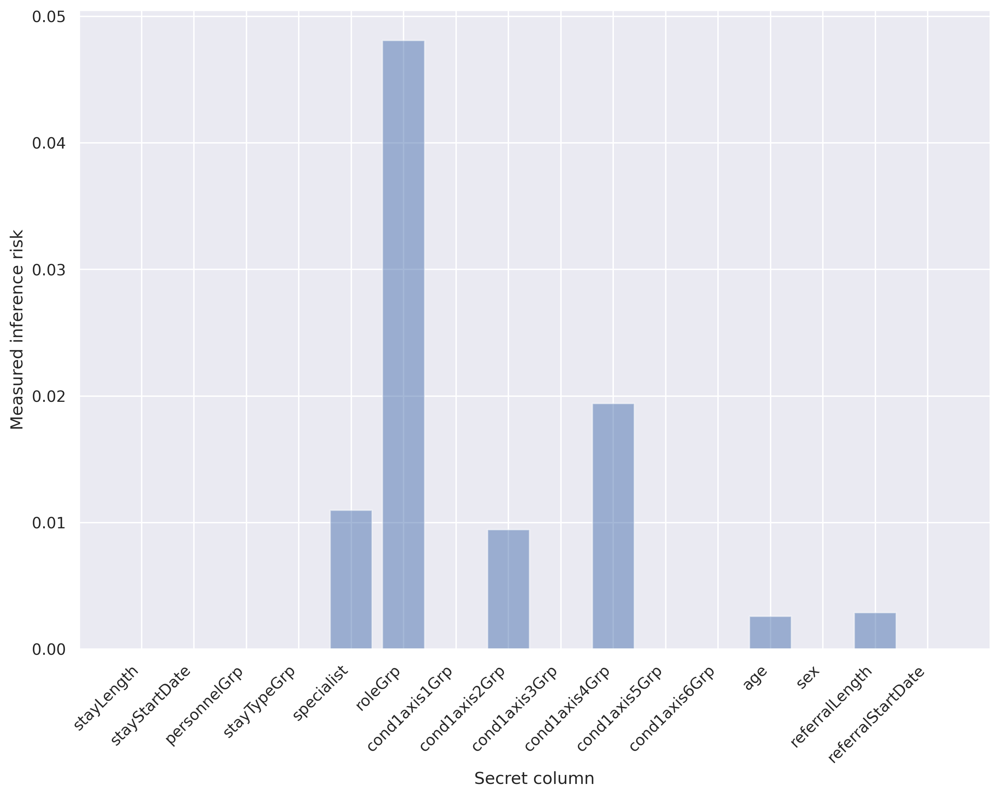

In [37]:
fig, ax = plt.subplots()

risks = [res[1].risk().value for res in results]
columns = [res[0] for res in results]

ax.bar(x=columns, height=risks, alpha=0.5, ecolor='black', capsize=10)

plt.xticks(rotation=45, ha='right')
ax.set_ylabel("Measured inference risk")
_ = ax.set_xlabel("Secret column")

# Prepare Real and Synthetic Data

In [119]:
from sklearn_extra.cluster import KMedoids
from pyclustering.cluster.kmedoids import kmedoids
from scipy.spatial.distance import pdist,squareform

random_state= 2

To validate the synthetising process, we  run a unsupervised model (clustering) on both the synthetic referal and real referal and compare the results. The clustering algithm used handles the mix of numerical and categorical feaztures in the dataset

In [120]:
df_referrals_synthetic_eval = df_referrals_synthetic.copy()
df_stays_synthetic_eval = df_stays_synthetic.copy()
#df_patients_synthetic_eval = df_patients_synth.copy()

In [121]:
df_referrals_synthetic.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 46380 entries, 0 to 46379
Data columns (total 5 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   referralID         46380 non-null  int64         
 1   referralStartDate  46380 non-null  datetime64[ns]
 2   referralLength     46380 non-null  int64         
 3   age                46380 non-null  int64         
 4   sex                46380 non-null  int64         
dtypes: datetime64[ns](1), int64(4)
memory usage: 1.8 MB


In [122]:
df_stays_synthetic_eval.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 530007 entries, 0 to 530006
Data columns (total 14 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   referralID     530007 non-null  int64         
 1   stayID         530007 non-null  int64         
 2   stayStartDate  530007 non-null  datetime64[ns]
 3   stayLength     530007 non-null  int64         
 4   personnelGrp   529816 non-null  object        
 5   stayTypeGrp    529487 non-null  object        
 6   specialist     526825 non-null  object        
 7   roleGrp        530001 non-null  object        
 8   cond1axis1Grp  529123 non-null  object        
 9   cond1axis2Grp  529705 non-null  object        
 10  cond1axis3Grp  530004 non-null  object        
 11  cond1axis4Grp  529753 non-null  object        
 12  cond1axis5Grp  529704 non-null  object        
 13  cond1axis6Grp  527306 non-null  object        
dtypes: datetime64[ns](1), int64(3), object(10)
memory us

In [123]:
df_referrals_synthetic = df_referrals_synthetic.fillna(df_referrals_synthetic.mode().iloc[0])
df_referrals_synthetic.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 46380 entries, 0 to 46379
Data columns (total 5 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   referralID         46380 non-null  int64         
 1   referralStartDate  46380 non-null  datetime64[ns]
 2   referralLength     46380 non-null  int64         
 3   age                46380 non-null  int64         
 4   sex                46380 non-null  int64         
dtypes: datetime64[ns](1), int64(4)
memory usage: 1.8 MB


In [124]:
df_stays_synthetic_eval = df_stays_synthetic_eval.fillna(df_stays_synthetic_eval.mode().iloc[0])
df_stays_synthetic_eval.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 530007 entries, 0 to 530006
Data columns (total 14 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   referralID     530007 non-null  int64         
 1   stayID         530007 non-null  int64         
 2   stayStartDate  530007 non-null  datetime64[ns]
 3   stayLength     530007 non-null  int64         
 4   personnelGrp   530007 non-null  object        
 5   stayTypeGrp    530007 non-null  object        
 6   specialist     530007 non-null  object        
 7   roleGrp        530007 non-null  object        
 8   cond1axis1Grp  530007 non-null  object        
 9   cond1axis2Grp  530007 non-null  object        
 10  cond1axis3Grp  530007 non-null  object        
 11  cond1axis4Grp  530007 non-null  object        
 12  cond1axis5Grp  530007 non-null  object        
 13  cond1axis6Grp  530007 non-null  object        
dtypes: datetime64[ns](1), int64(3), object(10)
memory us

<Axes: xlabel='ageGrp'>

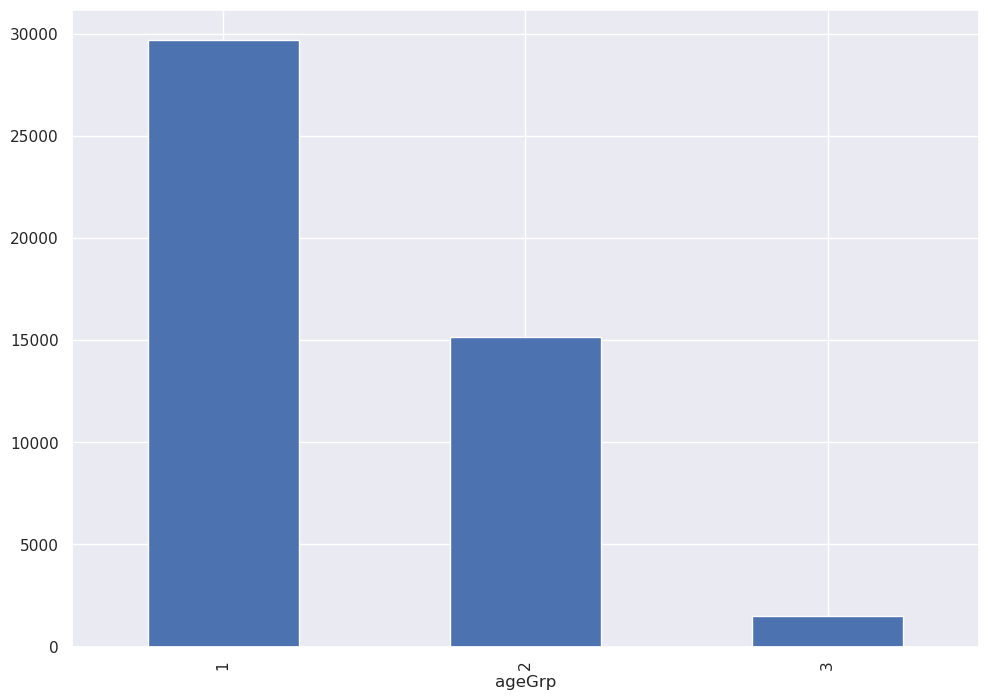

In [125]:
bins = [-1,13,20,10000 ]
labels = ['0-12','13-19', '20+']
df_referrals_synthetic_eval['ageGrpDesc'] = pd.cut(df_referrals_synthetic_eval.age, bins, labels = labels,include_lowest = True)
labels = ['1','2', '3']
df_referrals_synthetic_eval['ageGrp'] = pd.cut(df_referrals_synthetic_eval.age, bins, labels = labels,include_lowest = True)
df_referrals_synthetic_eval['ageGrp'].value_counts().plot(kind='bar')


In [126]:
df_referrals_synthetic_eval.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 46380 entries, 0 to 46379
Data columns (total 7 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   referralID         46380 non-null  int64         
 1   referralStartDate  46380 non-null  datetime64[ns]
 2   referralLength     46380 non-null  int64         
 3   age                46380 non-null  int64         
 4   sex                46380 non-null  int64         
 5   ageGrpDesc         46380 non-null  category      
 6   ageGrp             46380 non-null  category      
dtypes: category(2), datetime64[ns](1), int64(4)
memory usage: 1.9 MB


<Axes: xlabel='sexDesc'>

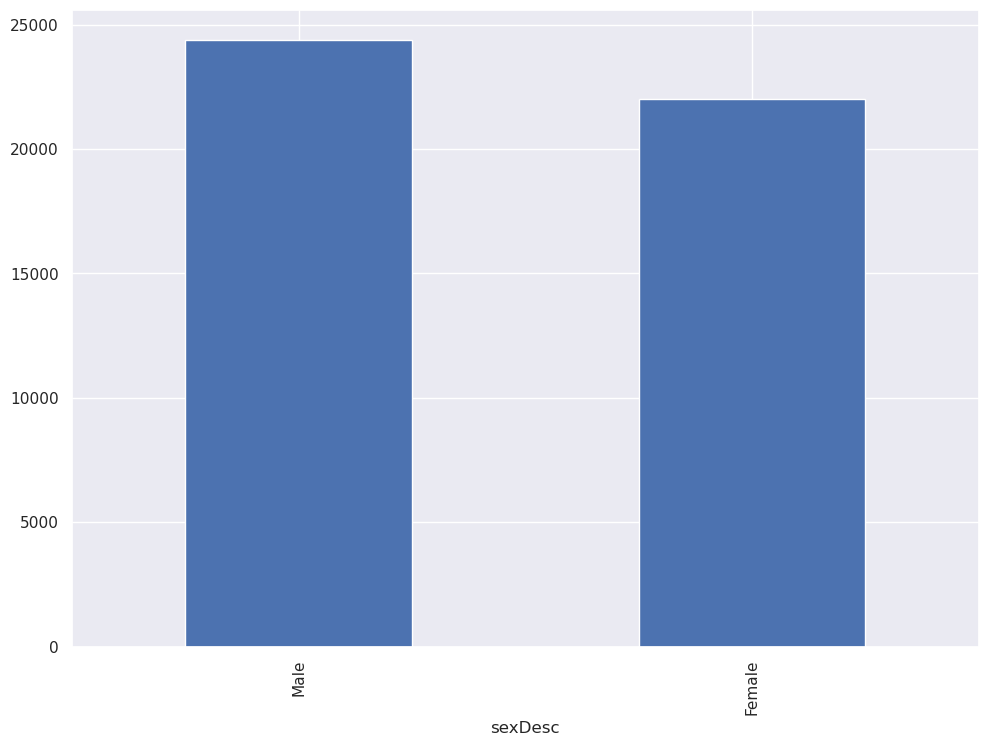

In [127]:
df_referrals_synthetic_eval['sexDesc'] = df_referrals_synthetic_eval['sex'].map({1:'Male', 2:'Female'})
df_referrals_synthetic_eval['sexDesc'].value_counts().plot(kind='bar')

In [128]:
df_referrals_synthetic_eval.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 46380 entries, 0 to 46379
Data columns (total 8 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   referralID         46380 non-null  int64         
 1   referralStartDate  46380 non-null  datetime64[ns]
 2   referralLength     46380 non-null  int64         
 3   age                46380 non-null  int64         
 4   sex                46380 non-null  int64         
 5   ageGrpDesc         46380 non-null  category      
 6   ageGrp             46380 non-null  category      
 7   sexDesc            46380 non-null  object        
dtypes: category(2), datetime64[ns](1), int64(4), object(1)
memory usage: 2.2+ MB


In [129]:

df =df_stays_synthetic_eval.groupby(['referralID']).agg({
#'kontaktTypeGrp_Direkte_pasientkontakt':'sum'
#,'kontaktTypeGrp_Indirekte_pasientkontakt':'sum'
'stayLength':'median' })
df.head()

,stayLength
referralID,
23190,104.0
23191,62.0
23192,91.5
23193,30.0
23194,43.5


In [130]:

              
                                         
                                         
                                        
df_referrals_synthetic_eval = pd.merge(df_referrals_synthetic_eval, df, how='left', left_on=['referralID'], right_on=['referralID'])
df_referrals_synthetic_eval.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 46380 entries, 0 to 46379
Data columns (total 9 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   referralID         46380 non-null  int64         
 1   referralStartDate  46380 non-null  datetime64[ns]
 2   referralLength     46380 non-null  int64         
 3   age                46380 non-null  int64         
 4   sex                46380 non-null  int64         
 5   ageGrpDesc         46380 non-null  category      
 6   ageGrp             46380 non-null  category      
 7   sexDesc            46380 non-null  object        
 8   stayLength         46380 non-null  float64       
dtypes: category(2), datetime64[ns](1), float64(1), int64(4), object(1)
memory usage: 2.6+ MB


In [131]:
sorted_df = df_stays_synthetic_eval[['referralID','stayStartDate','cond1axis1Grp']].sort_values(by=['referralID','stayStartDate'], ascending=True)
g= sorted_df.groupby(['referralID'])

In [132]:

df = g.head(1)[['referralID','cond1axis1Grp']]
df_referrals_synthetic_eval = pd.merge(df_referrals_synthetic_eval, df, how='left',on=['referralID'])
df_referrals_synthetic_eval.rename({'cond1axis1Grp': 'cond1axis1GrpFirst'}, axis=1, inplace=True) 
df_referrals_synthetic_eval.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 46380 entries, 0 to 46379
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   referralID          46380 non-null  int64         
 1   referralStartDate   46380 non-null  datetime64[ns]
 2   referralLength      46380 non-null  int64         
 3   age                 46380 non-null  int64         
 4   sex                 46380 non-null  int64         
 5   ageGrpDesc          46380 non-null  category      
 6   ageGrp              46380 non-null  category      
 7   sexDesc             46380 non-null  object        
 8   stayLength          46380 non-null  float64       
 9   cond1axis1GrpFirst  46380 non-null  object        
dtypes: category(2), datetime64[ns](1), float64(1), int64(4), object(2)
memory usage: 2.9+ MB


In [133]:




## First
#sorted_df = df_stays_synthetic_eval[['referralID','stayStartDate','cond1axis1Grp']].sort_values(by=['referralID','stayStartDate'], ascending=True)
#g= sorted_df.groupby(['referralID'])

#df = g.head(1)[['referralID','cond1axis1Grp']]

#df_referals_synthetic_eval = pd.merge(df_referrals_synthetic_eval, df, how='left',on=['referralID'])
#df_referrals_synthetic_eval.info()
#df_referrals_synthetic_eval.rename(columns={'cond1axis1Grp':'cond1axis1GrpFirst'}, inplace=True)
#df_referals_synthetic_eval.head()
#df_referrals_synthetic_eval.info()
#df_referals_synthetic_eval.head()
### Last
df = g.tail(1)[['referralID','cond1axis1Grp']]
df_referrals_synthetic_eval = pd.merge(df_referrals_synthetic_eval, df, how='left',on=['referralID'])
df_referrals_synthetic_eval.rename(columns={'cond1axis1Grp': 'cond1axis1GrpLast'}, inplace=True)
df_referrals_synthetic_eval.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 46380 entries, 0 to 46379
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   referralID          46380 non-null  int64         
 1   referralStartDate   46380 non-null  datetime64[ns]
 2   referralLength      46380 non-null  int64         
 3   age                 46380 non-null  int64         
 4   sex                 46380 non-null  int64         
 5   ageGrpDesc          46380 non-null  category      
 6   ageGrp              46380 non-null  category      
 7   sexDesc             46380 non-null  object        
 8   stayLength          46380 non-null  float64       
 9   cond1axis1GrpFirst  46380 non-null  object        
 10  cond1axis1GrpLast   46380 non-null  object        
dtypes: category(2), datetime64[ns](1), float64(1), int64(4), object(3)
memory usage: 3.3+ MB


In [134]:
stays_groupby= df_stays_synthetic_eval.groupby('referralID', as_index=False)['stayID'].count()
stays_groupby.head()


,referralID,stayID
0,23190,3
1,23191,14
2,23192,6
3,23193,16
4,23194,4


In [135]:
df_referrals_synthetic_eval = pd.merge(df_referrals_synthetic_eval, stays_groupby, how='left', left_on=['referralID'], right_on=['referralID'])
df_referrals_synthetic_eval.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 46380 entries, 0 to 46379
Data columns (total 12 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   referralID          46380 non-null  int64         
 1   referralStartDate   46380 non-null  datetime64[ns]
 2   referralLength      46380 non-null  int64         
 3   age                 46380 non-null  int64         
 4   sex                 46380 non-null  int64         
 5   ageGrpDesc          46380 non-null  category      
 6   ageGrp              46380 non-null  category      
 7   sexDesc             46380 non-null  object        
 8   stayLength          46380 non-null  float64       
 9   cond1axis1GrpFirst  46380 non-null  object        
 10  cond1axis1GrpLast   46380 non-null  object        
 11  stayID              46380 non-null  int64         
dtypes: category(2), datetime64[ns](1), float64(1), int64(5), object(3)
memory usage: 3.6+ MB


In [136]:
df_referrals_synthetic_eval.rename(columns = {'stayID':'numOfStays'}, inplace = True)

In [137]:
#df_referrals_synthetic_eval = pd.merge(df_referrals_synthetic_eval, df_patients_synthetic_eval,how='left', left_on=['patientNr'], right_on=['patientNr'] )
df_referrals_synthetic_eval.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 46380 entries, 0 to 46379
Data columns (total 12 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   referralID          46380 non-null  int64         
 1   referralStartDate   46380 non-null  datetime64[ns]
 2   referralLength      46380 non-null  int64         
 3   age                 46380 non-null  int64         
 4   sex                 46380 non-null  int64         
 5   ageGrpDesc          46380 non-null  category      
 6   ageGrp              46380 non-null  category      
 7   sexDesc             46380 non-null  object        
 8   stayLength          46380 non-null  float64       
 9   cond1axis1GrpFirst  46380 non-null  object        
 10  cond1axis1GrpLast   46380 non-null  object        
 11  numOfStays          46380 non-null  int64         
dtypes: category(2), datetime64[ns](1), float64(1), int64(5), object(3)
memory usage: 3.6+ MB


## Prepare  Data for validation (Cluster + Regression)

In [138]:
import functions
import importlib
importlib.reload(functions)

from functions import get_pca_3d,plot_pca_3d,plot_pca_2d,get_pca_2d,get_MCA_3d,get_MCA_2d

In [139]:
df_referrals_real_orig= df_referrals_t.copy()
df_referrals_synth_orig= df_referrals_synthetic_eval.copy()

In [140]:
df_referrals_real_orig.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7730 entries, 0 to 7729
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   referralID          7730 non-null   int64         
 1   patientNr           7730 non-null   int64         
 2   age                 7730 non-null   int64         
 3   sex                 7730 non-null   object        
 4   referralStartDate   7730 non-null   datetime64[ns]
 5   referralEndDate     7730 non-null   datetime64[ns]
 6   referralLength      7730 non-null   int64         
 7   numOfStays          7730 non-null   int64         
 8   cond1axis1GrpLast   7730 non-null   object        
 9   cond1axis1GrpFirst  7730 non-null   object        
 10  sexDesc             7730 non-null   object        
 11  ageGrpDesc          7729 non-null   category      
 12  ageGrp              7729 non-null   category      
dtypes: category(2), datetime64[ns](2), int64(5), obj

In [141]:
df_referrals_synth_orig.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 46380 entries, 0 to 46379
Data columns (total 12 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   referralID          46380 non-null  int64         
 1   referralStartDate   46380 non-null  datetime64[ns]
 2   referralLength      46380 non-null  int64         
 3   age                 46380 non-null  int64         
 4   sex                 46380 non-null  int64         
 5   ageGrpDesc          46380 non-null  category      
 6   ageGrp              46380 non-null  category      
 7   sexDesc             46380 non-null  object        
 8   stayLength          46380 non-null  float64       
 9   cond1axis1GrpFirst  46380 non-null  object        
 10  cond1axis1GrpLast   46380 non-null  object        
 11  numOfStays          46380 non-null  int64         
dtypes: category(2), datetime64[ns](1), float64(1), int64(5), object(3)
memory usage: 3.6+ MB


In [142]:
df_referrals_real_orig.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7730 entries, 0 to 7729
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   referralID          7730 non-null   int64         
 1   patientNr           7730 non-null   int64         
 2   age                 7730 non-null   int64         
 3   sex                 7730 non-null   object        
 4   referralStartDate   7730 non-null   datetime64[ns]
 5   referralEndDate     7730 non-null   datetime64[ns]
 6   referralLength      7730 non-null   int64         
 7   numOfStays          7730 non-null   int64         
 8   cond1axis1GrpLast   7730 non-null   object        
 9   cond1axis1GrpFirst  7730 non-null   object        
 10  sexDesc             7730 non-null   object        
 11  ageGrpDesc          7729 non-null   category      
 12  ageGrp              7729 non-null   category      
dtypes: category(2), datetime64[ns](2), int64(5), obj

In [143]:
df_referrals_real_orig = df_referrals_real_orig[~df_referrals_real_orig.cond1axis1GrpLast.isin(['Z00-Z13','R40-R46','1999'])]

df_referrals_synth_orig = df_referrals_synth_orig[~df_referrals_synth_orig.cond1axis1GrpLast.isin(['Z00-Z13','R40-R46','1999'])]


In [144]:
df_referrals_real_orig.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4933 entries, 0 to 7727
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   referralID          4933 non-null   int64         
 1   patientNr           4933 non-null   int64         
 2   age                 4933 non-null   int64         
 3   sex                 4933 non-null   object        
 4   referralStartDate   4933 non-null   datetime64[ns]
 5   referralEndDate     4933 non-null   datetime64[ns]
 6   referralLength      4933 non-null   int64         
 7   numOfStays          4933 non-null   int64         
 8   cond1axis1GrpLast   4933 non-null   object        
 9   cond1axis1GrpFirst  4933 non-null   object        
 10  sexDesc             4933 non-null   object        
 11  ageGrpDesc          4932 non-null   category      
 12  ageGrp              4932 non-null   category      
dtypes: category(2), datetime64[ns](2), int64(5), object(4

In [145]:
df_referrals_synth_orig.info()

<class 'pandas.core.frame.DataFrame'>
Index: 22656 entries, 0 to 46378
Data columns (total 12 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   referralID          22656 non-null  int64         
 1   referralStartDate   22656 non-null  datetime64[ns]
 2   referralLength      22656 non-null  int64         
 3   age                 22656 non-null  int64         
 4   sex                 22656 non-null  int64         
 5   ageGrpDesc          22656 non-null  category      
 6   ageGrp              22656 non-null  category      
 7   sexDesc             22656 non-null  object        
 8   stayLength          22656 non-null  float64       
 9   cond1axis1GrpFirst  22656 non-null  object        
 10  cond1axis1GrpLast   22656 non-null  object        
 11  numOfStays          22656 non-null  int64         
dtypes: category(2), datetime64[ns](1), float64(1), int64(5), object(3)
memory usage: 1.9+ MB


remove referral-periods with 0 length and more than one episode

In [146]:
df_referrals_real_orig =df_referrals_real_orig[~((df_referrals_real_orig['referralLength']==0) &  (df_referrals_real_orig['numOfStays']>1)) ]
df_referrals_real_orig.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4929 entries, 0 to 7727
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   referralID          4929 non-null   int64         
 1   patientNr           4929 non-null   int64         
 2   age                 4929 non-null   int64         
 3   sex                 4929 non-null   object        
 4   referralStartDate   4929 non-null   datetime64[ns]
 5   referralEndDate     4929 non-null   datetime64[ns]
 6   referralLength      4929 non-null   int64         
 7   numOfStays          4929 non-null   int64         
 8   cond1axis1GrpLast   4929 non-null   object        
 9   cond1axis1GrpFirst  4929 non-null   object        
 10  sexDesc             4929 non-null   object        
 11  ageGrpDesc          4928 non-null   category      
 12  ageGrp              4928 non-null   category      
dtypes: category(2), datetime64[ns](2), int64(5), object(4

In [147]:
df_referrals_synth_orig =df_referrals_synth_orig[~((df_referrals_synth_orig['referralLength']==0) &  (df_referrals_synth_orig['numOfStays']>1)) ]
df_referrals_synth_orig.info()

<class 'pandas.core.frame.DataFrame'>
Index: 22634 entries, 0 to 46378
Data columns (total 12 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   referralID          22634 non-null  int64         
 1   referralStartDate   22634 non-null  datetime64[ns]
 2   referralLength      22634 non-null  int64         
 3   age                 22634 non-null  int64         
 4   sex                 22634 non-null  int64         
 5   ageGrpDesc          22634 non-null  category      
 6   ageGrp              22634 non-null  category      
 7   sexDesc             22634 non-null  object        
 8   stayLength          22634 non-null  float64       
 9   cond1axis1GrpFirst  22634 non-null  object        
 10  cond1axis1GrpLast   22634 non-null  object        
 11  numOfStays          22634 non-null  int64         
dtypes: category(2), datetime64[ns](1), float64(1), int64(5), object(3)
memory usage: 1.9+ MB


### Filter 20 + agegroup

In [148]:
df_referrals_real_orig = df_referrals_real_orig[~df_referrals_real_orig.ageGrpDesc.isin(['20+'])]
df_referrals_real_orig.info()

df_referrals_synth_orig = df_referrals_synth_orig[~df_referrals_synth_orig.ageGrpDesc.isin(['20+'])]
df_referrals_synth_orig.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4896 entries, 0 to 7727
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   referralID          4896 non-null   int64         
 1   patientNr           4896 non-null   int64         
 2   age                 4896 non-null   int64         
 3   sex                 4896 non-null   object        
 4   referralStartDate   4896 non-null   datetime64[ns]
 5   referralEndDate     4896 non-null   datetime64[ns]
 6   referralLength      4896 non-null   int64         
 7   numOfStays          4896 non-null   int64         
 8   cond1axis1GrpLast   4896 non-null   object        
 9   cond1axis1GrpFirst  4896 non-null   object        
 10  sexDesc             4896 non-null   object        
 11  ageGrpDesc          4895 non-null   category      
 12  ageGrp              4895 non-null   category      
dtypes: category(2), datetime64[ns](2), int64(5), object(4

### Recode Numerical Variables

In [149]:
import functions
import importlib
importlib.reload(functions)
from functions import get_knn_bins
from sklearn.preprocessing import KBinsDiscretizer

In [150]:
numeric_cols=['referralLength', 'numOfStays']

In [151]:
df_referrals_synth_orig.info()

<class 'pandas.core.frame.DataFrame'>
Index: 21950 entries, 0 to 46378
Data columns (total 12 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   referralID          21950 non-null  int64         
 1   referralStartDate   21950 non-null  datetime64[ns]
 2   referralLength      21950 non-null  int64         
 3   age                 21950 non-null  int64         
 4   sex                 21950 non-null  int64         
 5   ageGrpDesc          21950 non-null  category      
 6   ageGrp              21950 non-null  category      
 7   sexDesc             21950 non-null  object        
 8   stayLength          21950 non-null  float64       
 9   cond1axis1GrpFirst  21950 non-null  object        
 10  cond1axis1GrpLast   21950 non-null  object        
 11  numOfStays          21950 non-null  int64         
dtypes: category(2), datetime64[ns](1), float64(1), int64(5), object(3)
memory usage: 1.9+ MB


In [152]:
df_referrals_real_orig['factor'] =df_referrals_real_orig['referralLength']/365
df_referrals_real_orig['intensity']=df_referrals_real_orig['numOfStays']/df_referrals_real_orig['factor']

In [153]:
df_referrals_real_orig= df_referrals_real_orig.replace(np.inf, 0)

In [154]:
df_referrals_synth_orig['factor'] =df_referrals_synth_orig['referralLength']/365
df_referrals_synth_orig['intensity']=df_referrals_synth_orig['numOfStays']/df_referrals_synth_orig['factor']


In [155]:
df_referrals_synth_orig= df_referrals_synth_orig.replace(np.inf, 0)


In [156]:
bins = [0,15,51,30000]
labels = ['low' ,'medium','high']
df_referrals_synth_orig['intensityGrp'] = pd.cut(df_referrals_synth_orig.intensity, bins, labels = labels,include_lowest = True)

df_referrals_synth_orig['intensityGrp'].value_counts()

intensityGrp
low       15021
medium     5212
high       1717
Name: count, dtype: int64

In [157]:
bins = [0,15,51,30000]
labels = ['low' ,'medium','high']
df_referrals_real_orig['intensityGrp'] = pd.cut(df_referrals_real_orig.intensity, bins, labels = labels,include_lowest = True)
df_referrals_real_orig['intensityGrp'].value_counts()

intensityGrp
low       3617
medium    1176
high       103
Name: count, dtype: int64

In [158]:

df_referrals_synth_orig[df_referrals_synth_orig.isna().any(axis=1)]

,referralID,referralStartDate,referralLength,age,sex,ageGrpDesc,ageGrp,sexDesc,stayLength,cond1axis1GrpFirst,cond1axis1GrpLast,numOfStays,factor,intensity,intensityGrp


### remove a NAN

In [159]:

df_referrals_real_orig.dropna(inplace=True)

df_referrals_real_orig[df_referrals_real_orig.isna().any(axis=1)]
df_referrals_synth_orig.dropna(inplace=True)

df_referrals_synth_orig[df_referrals_synth_orig.isna().any(axis=1)]

,referralID,referralStartDate,referralLength,age,sex,ageGrpDesc,ageGrp,sexDesc,stayLength,cond1axis1GrpFirst,cond1axis1GrpLast,numOfStays,factor,intensity,intensityGrp


### Remove outliers

In [160]:
from pyod.models.ecod import ECOD
# https://github.com/yzhao062/pyod
numerical_features= ['referralLength','numOfStays']

df =df_referrals_synth_orig[ numerical_features]
clf = ECOD()
clf.fit(df)


out = clf.predict(df) 
df_referrals_synth_orig["outliers"] = out


df_referrals_synth_orig_no_out = df_referrals_synth_orig[df_referrals_synth_orig["outliers"] == 0]
df_referrals_synth_orig_no_out = df_referrals_synth_orig_no_out.drop(["outliers"], axis = 1)


df =df_referrals_real_orig[ numerical_features]
clf = ECOD()
clf.fit(df)


out = clf.predict(df) 
df_referrals_real_orig["outliers"] = out


df_referrals_real_orig_no_out = df_referrals_real_orig[df_referrals_real_orig["outliers"] == 0]
df_referrals_real_orig_no_out = df_referrals_real_orig_no_out.drop(["outliers"], axis = 1)

In [161]:

df_referrals_synth_orig.to_csv("../../../data/synthetic/referrals_synthetic_processed.csv", sep='\t',index=False)

In [162]:
df_referrals_real_orig.to_csv("../../../data/processed/referrals_real_processed.csv", sep='\t',index=False)